# Transform Domain and Linear Filters

---

In this practical work, we study some tools to analyze images in the space-frequency domain. We analyze the spectral content of different images and see the effects of aliasing and experiment with filtering in the frequency domain.

## 1 Lab configuration

First of all, we will make sure to install the requeried toolboxes for this excercise (you may need to re-start the runtime after this step):

In [ ]:
!pip install --upgrade numpy scikit-image pillow plotly

It may be useful to have an efficient way to transfer data from your google drive to colaboratory. This can be done by mounting your google drive in the colaboratory environment. Use your own image (grayscale) and the provided `test1.bmp`:

In [ ]:
!pip install google.colab

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
!wget "https://drive.google.com/uc?id=1eycfbbHEODVwvw0ZTNOC86W9SluaC-Lt" -O "test1.bmp"

Display the images to check they have been uploaded correctly. Please change the name of the file you uploaded in the previous section.

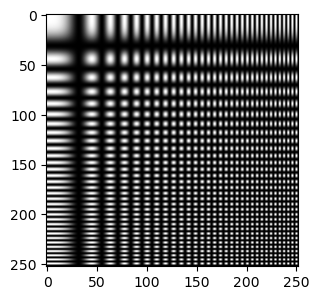

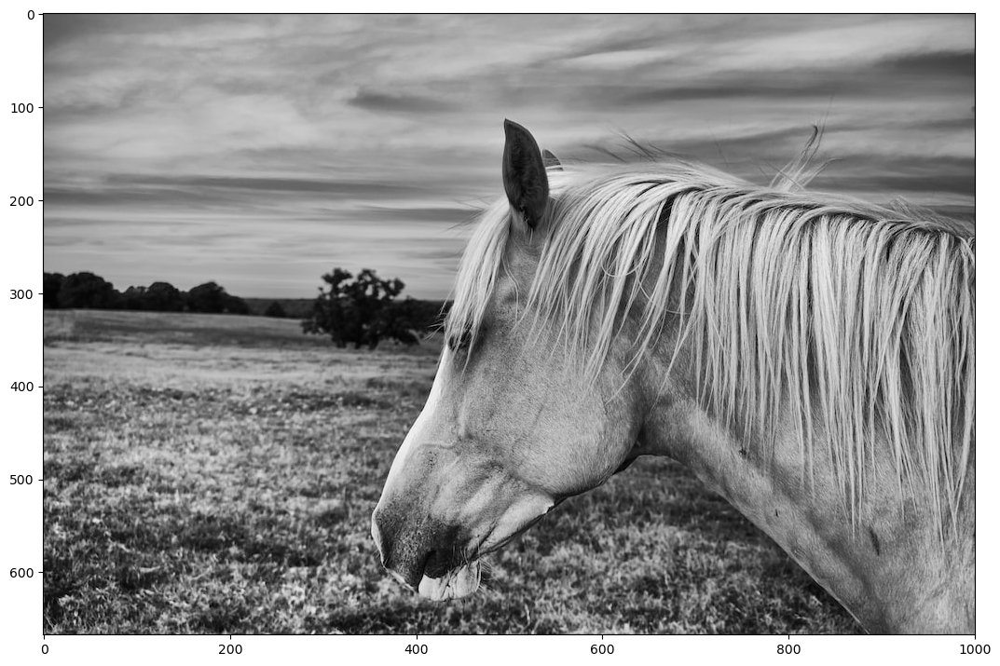

In [1]:
from skimage import io as skio
from skimage import transform as sktf
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go


# Read the files from notebook disk
test1 = skio.imread('test1.bmp')
img = skio.imread('foto.bmp',as_gray=True)

def display_image(img, title='', size=None):
  #plt.subplot(1,2,1)
  plt.gray()
  h = plt.imshow(img, interpolation='none')
  if size:
    dpi = h.figure.get_dpi()/size
    h.figure.set_figwidth(img.shape[1] / dpi)
    h.figure.set_figheight(img.shape[0] / dpi)
    h.figure.canvas.manager.resize(img.shape[1] + 1, img.shape[0] + 1)
    h.axes.set_position([0, 0, 1, 1])
    h.axes.set_xlim(-1, img.shape[1])
    h.axes.set_ylim(img.shape[0], -1)
  plt.grid(False)
  plt.title(title)  
  plt.show()

def display_ft(ft, title='', centered=True):
  N = ft.shape[0]
  if centered:
    x = np.linspace(-0.5, 0.5, N)
    y = np.linspace(-0.5, 0.5, N)
  else:
    x = np.linspace(0, 1.0, N)
    y = np.linspace(0, 1.0, N)
  X, Y = np.meshgrid(x, y)
  fig = go.Figure(data=[go.Surface(z=ft,x=X,y=Y)])
  fig.update_layout(title=title)
  fig.update_layout(scene = dict(xaxis_title='Fx', yaxis_title='Fy', zaxis_title='FT'))
  fig.show()

def display_dft(ft, title=''):
  fig = go.Figure(data=[go.Surface(z=ft)])
  fig.update_layout(title=title)
  fig.update_layout(scene = dict(xaxis_title='k', yaxis_title='l', zaxis_title='DFT'))
  fig.show()

display_image(test1, size=1)
display_image(img, size=1)

## 2	Discrete Fourier Transform (DFT) and its representation


---


Now we'll display the transforms of these images. We'll benefit from the case-sensitive of python to name the transform in capital letters. First, we compute the transform:


In [2]:
IMG = np.fft.fft2(img)


Then, we display its modulus. We need to display the values in a logarithmic scale (you can try what would happen if we use the linear scale, i.e. without the log):

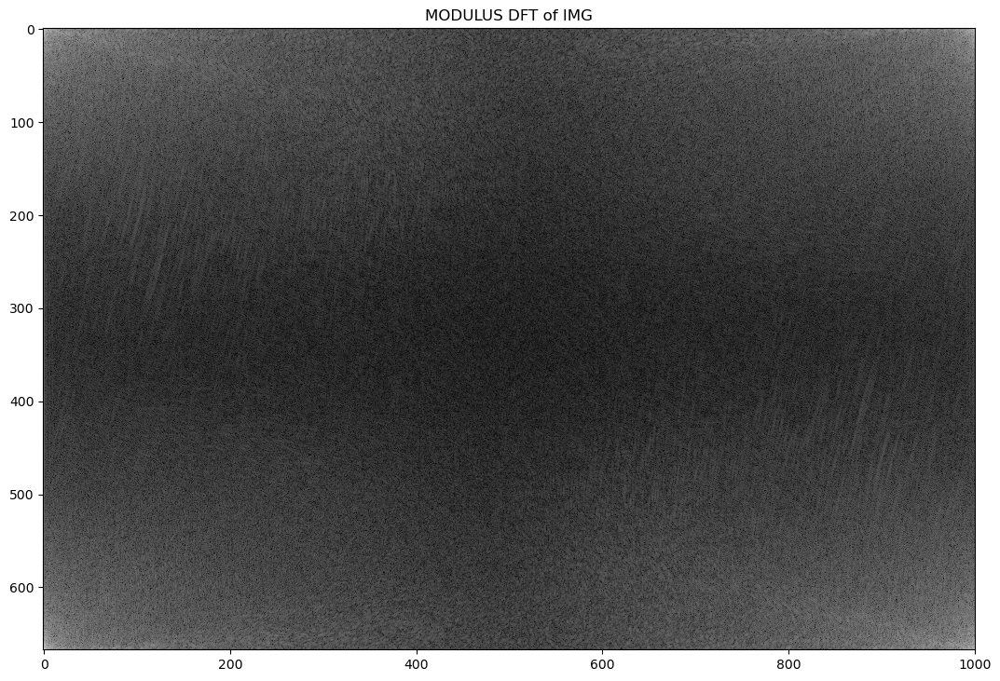

In [3]:
display_image(np.log(1+np.abs(IMG)), title='MODULUS DFT of IMG', size=1)

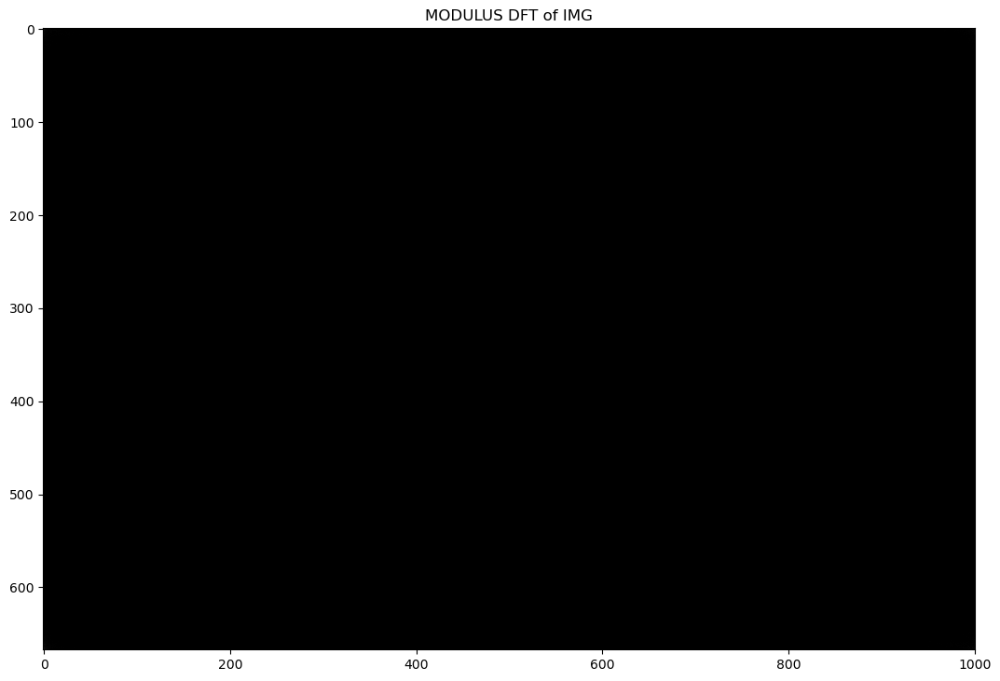

In [4]:
display_image(np.abs(IMG), title='MODULUS DFT of IMG', size=1)

The DC component in the transform domain of IMG is located in the top left corner of the display. Remember that the spectrum of a discrete signal is $2\pi$-periodic. The DFT represents with N samples (if N is the length of the transform) one period of the spectrum. In 2D, the transform image has period $NxN$. In fact, the transform matrix IMG that we have computed presents only the samples of the fundamental period from $[0,2\pi) x [0,2\pi)$.

To visualize image transforms, we use to display the DC component in the center of the picture. In this way, it is easier to see the conjugate symmetry of the transform of a real signal. We use the function fftshift() to do this: 

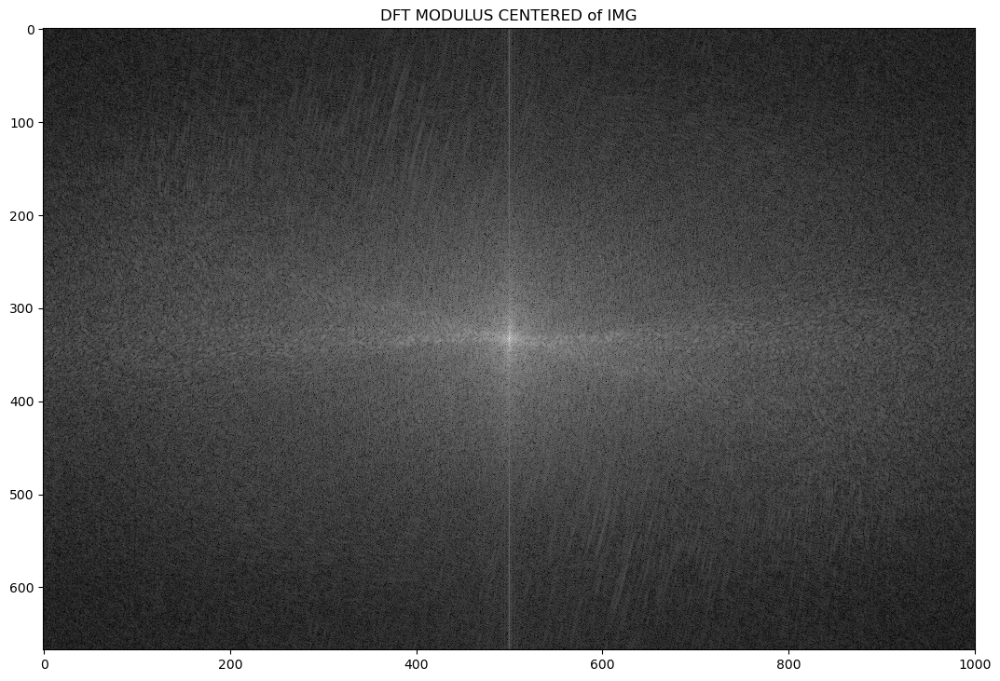

In [5]:
IMG_mod=np.fft.fftshift(np.log(1+np.abs(IMG)))
display_image(IMG_mod, title='DFT MODULUS CENTERED of IMG', size=1)

<font color='purple'>Try to relate details observed in the image spectra with the original content.</font>
    
**First of all we look at the original image. There are some intense changes of color. Among them, we can highlight the horizon line (splitting sky-mountain), abrupt changes in the color of the field or even in some parts of the sky and the hair of the horse.**

**Taking this into account, and relating the horizontal (vertical) abrupt changes of color in the original image with vertical (horizontal) changes in the DFT image, some conclusions can be taken away. Therefore we may assume that, in the DFT image, the vertical white line is representing (or at least highly influenced by) the skyline, the diagonal dark white lines(that are
quite similar to rain) are representing the changes in pixel values of, on the one hand the grass, and the other, the clouds. Finally, some energy is also detected in middle frequencies that might be related with horse's hair.**

**It is necessary to keep in mind that this analysis has been done using the log transformation for the DFT, which highlights the low frequencies.**
</font> 

Now, you can follow the same process for `test1` image to generate the modulus of its transform. Write the necessary  commands. As before, use capital letters to name the transform: `TEST1` and `TEST1_mod`. As can be seen, the `test1` image is a low pass signal. 

In [6]:
# Display test1 DFT
TEST1 = np.fft.fft2(test1)

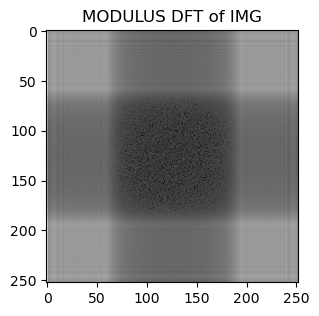

In [7]:
display_image(np.log(1+np.abs(TEST1)), title='MODULUS DFT of IMG', size=1)

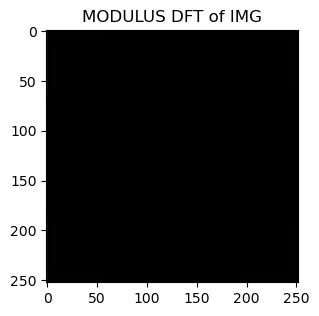

In [8]:
display_image(np.abs(TEST1), title='MODULUS DFT of IMG', size=1)

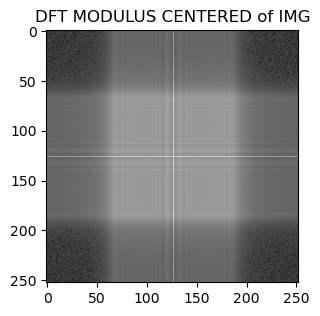

In [9]:
TEST1_mod=np.fft.fftshift(np.log(1+np.abs(TEST1)))
display_image(TEST1_mod, title='DFT MODULUS CENTERED of IMG', size=1)


<font color='purple'>Estimate the horizontal and the vertical bandwidth of the image (give your answer with normalized frequencies).</font>

    
**In order to find the bandwidth we have to consider those points in the DFT representation that accumulate almost all energy. Therefore, we are going to look at the color, where white represents high energy and black lower ones.**
    
**Bearing in mind that the log has been applied, we can consider that pixels with value dark grey (almost black) can be considered insignificant.**

**As the frequency is normalized and the representation is centered, by looking at the image, we can tell that the range that comprisses all of the energy is found inside the square that goes from sample 60 to sample 180 for vertical axe, and the same range for horizontal axe.**

**Translating this to frequency domain, this values become -1/4 to 1/4 for both axes, which means that the bandwidth = $\frac{1}{4} - (-\frac{1}{4}) = 1/2$.**

</font>  


## 3 Down sampling and aliasing


---

Nyquist theorem establishes that we should limit the bandwidth of a given signal before sampling (or downsampling) to half the new sampling frequency. Otherwise, aliasing might occur. In this section, we are going to downsample images without filtering, and see what happens in the resulting spectra. We are going to use the function [resize](http://scikit-image.org/docs/stable/api/skimage.transform.html#resize) from the skimage toolbox. To downsample an image by a factor 3, you can use it as follows. You can use the parameter `size` to zoom the figure without doing any upsampling.

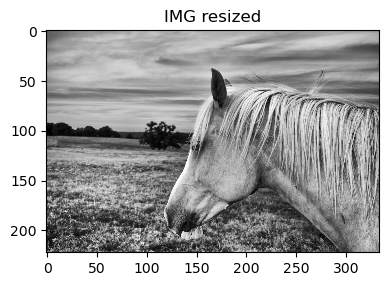

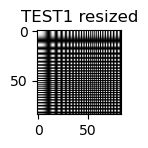

In [10]:
from skimage import transform

img_sub = transform.resize(img,np.asarray(img.shape)/3, anti_aliasing=False, mode='constant');
display_image(img_sub,title='IMG resized', size=1)

test1_sub=transform.resize(test1,np.asarray(test1.shape)/3, anti_aliasing=False, mode='constant');
display_image(test1_sub, title='TEST1 resized', size=1)


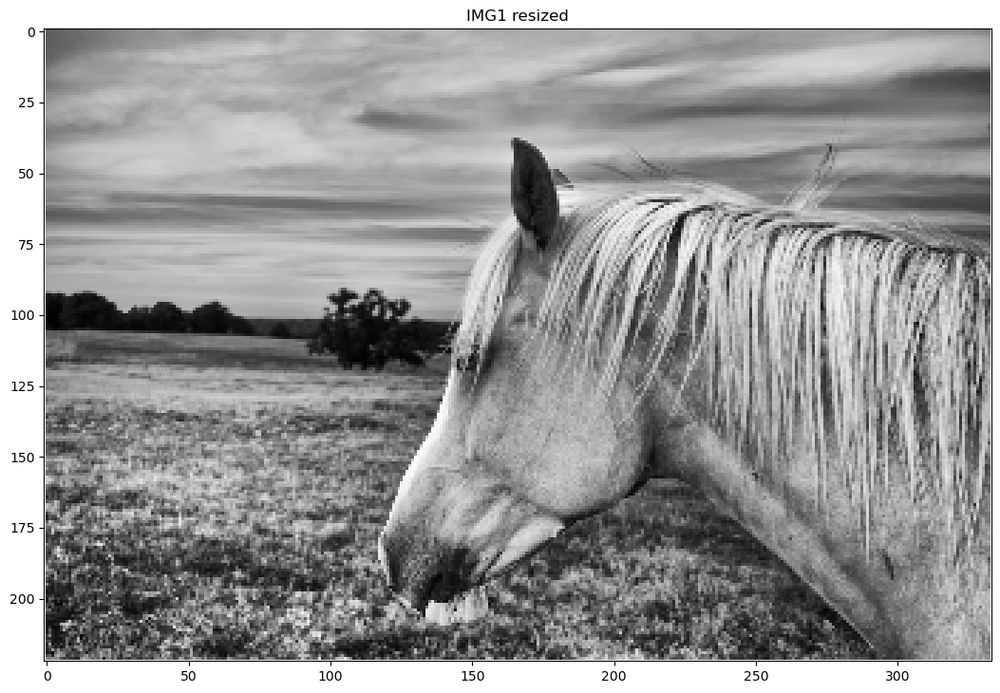

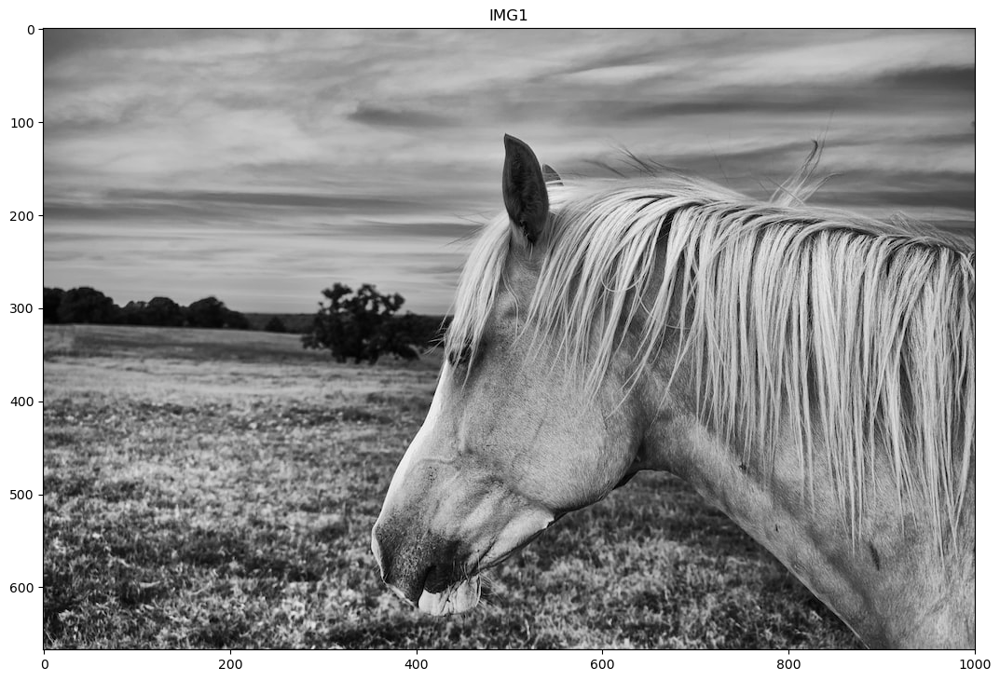

In [11]:
display_image(img_sub, title='IMG1 resized', size=3)
display_image(img, title='IMG1', size=1)


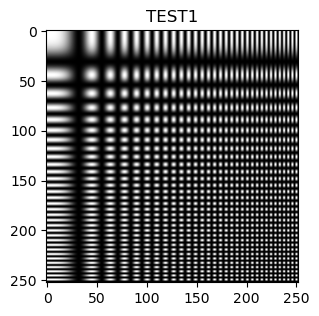

In [12]:
display_image(test1, title='TEST1', size=1)

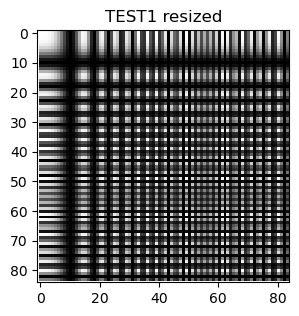

In [13]:
display_image(test1_sub, title='TEST1 resized', size=3)


<font color='purple'>Can you interpret the results? Is there any special effect? Try to explain the effect you see when displaying the downsampled version of `test1`.</font>

---
<font color='red'>Answer: 
</font>

**With downsampling, what we have done is set some columns and rows to zero and then remove them, resulting in the removal of several shades of gray. For example, in the top left area of the original image, we could see a gradual change from white to black. However, after downsampling, we see a kind of sqaures in shades of gray. In terms of frequency, this is explained because high frequencies have been removed and this transition is not being smoothed out. Therefore, we go from a position with a white color to another with a color that is not as white. In Test 1, we see that this makes it difficult to distinguish as many squares in the resized image as we could in the original. Also, the edges of different shapes are not as clearly distinguishable as they were in the original image.**

Let's see the spectra of these images before and after the downsampling:

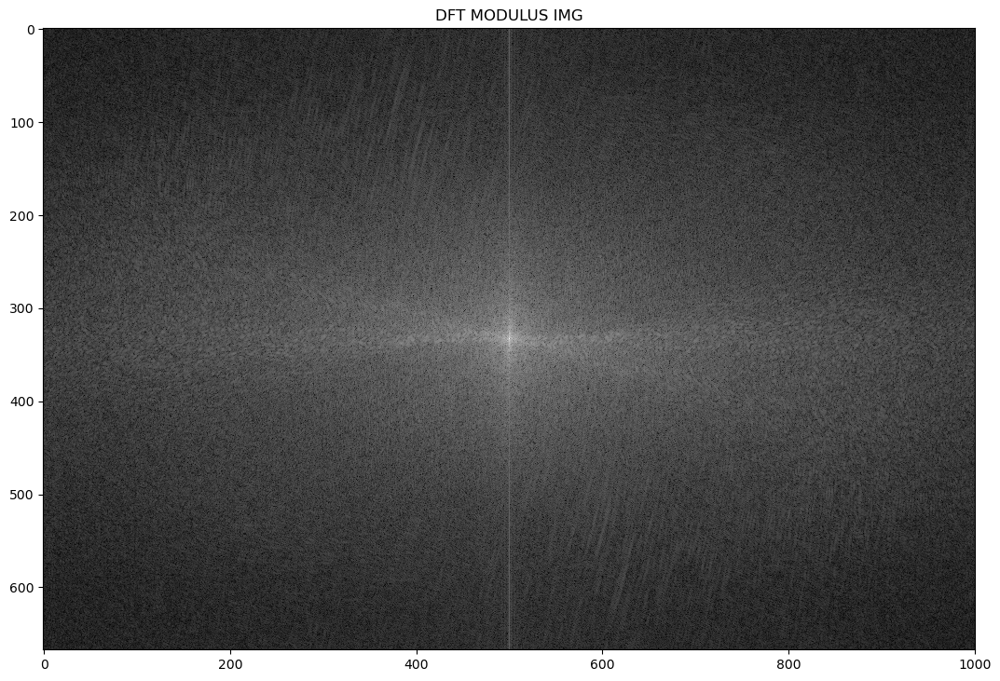

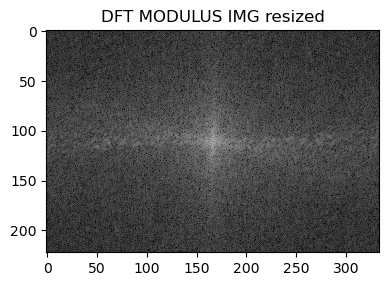

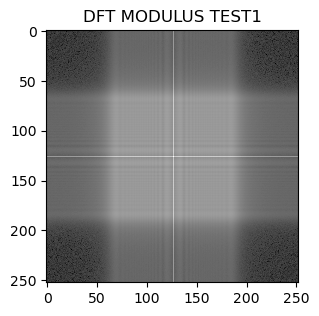

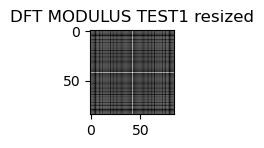

In [14]:
IMG_sub_mod = np.fft.fftshift(np.log(1+np.abs(np.fft.fft2(img_sub))))
display_image(IMG_mod, title='DFT MODULUS IMG', size=1)
display_image(IMG_sub_mod, title='DFT MODULUS IMG resized', size=1)

TEST1_mod = np.fft.fftshift(np.log(1+np.abs(np.fft.fft2(test1)))) # DELETE
TEST1_sub_mod = np.fft.fftshift(np.log(1+np.abs(np.fft.fft2(test1_sub))))
display_image(TEST1_mod, title='DFT MODULUS TEST1', size=1)
display_image(TEST1_sub_mod, title='DFT MODULUS TEST1 resized', size=1)

Actually, the transforms being visualized show only one period of the spectrum of the images after downsampling. We are going to manipulate the transform matrices in order to display, side by side, several spectral replicas of the spectrum to show the periodicity effect. This will give a more precise idea of what is going on with the downsampling:

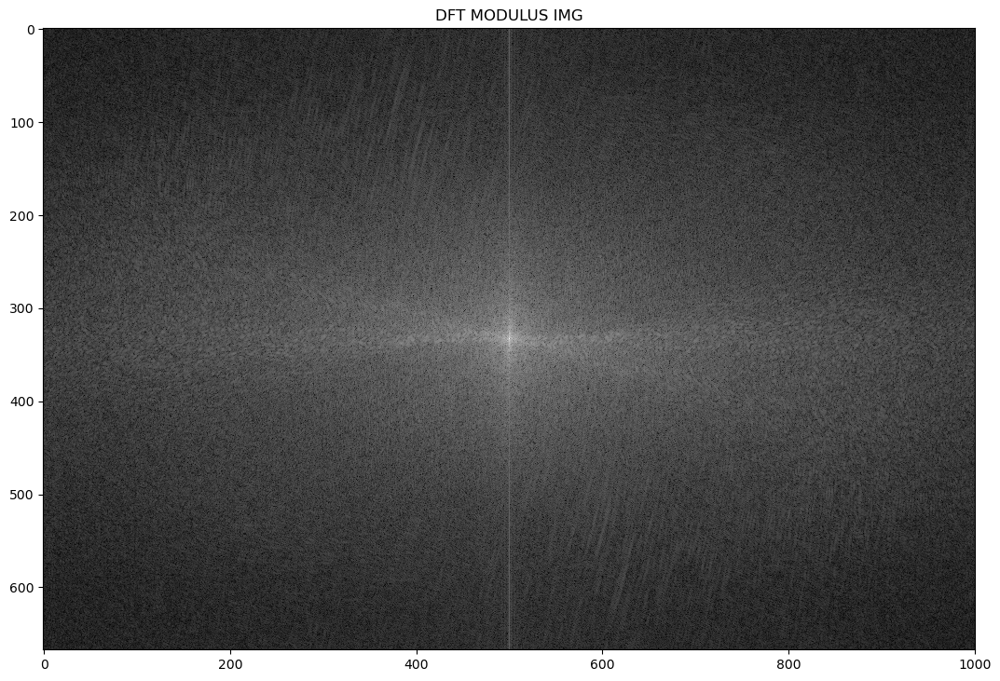

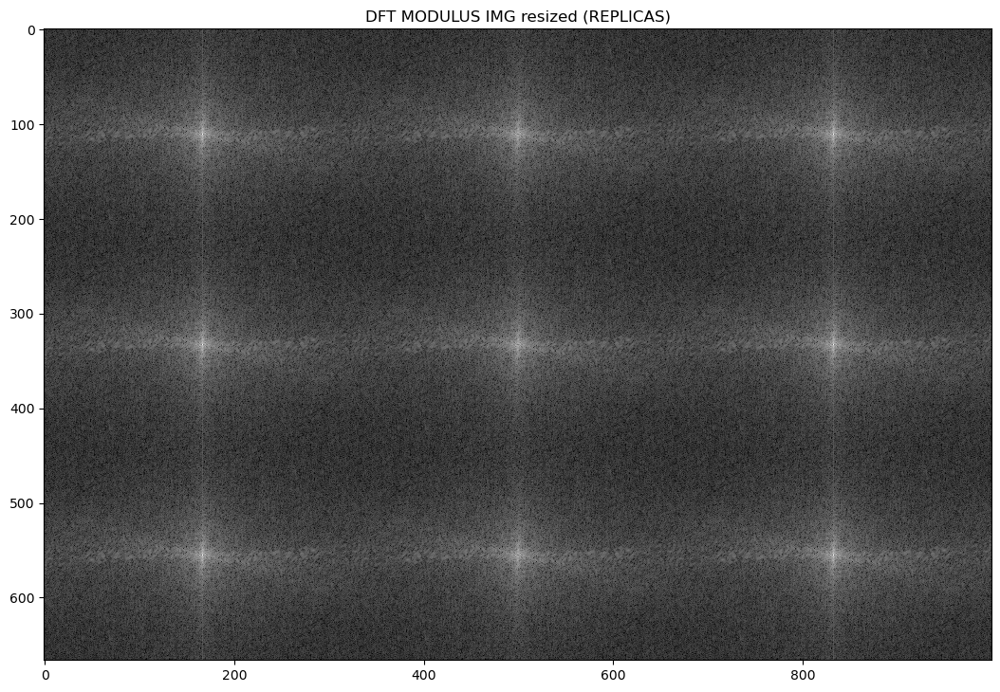

In [15]:
display_image(IMG_mod, title='DFT MODULUS IMG', size=1)
tmp = np.hstack((IMG_sub_mod,IMG_sub_mod,IMG_sub_mod))
IMG_sub_mod_replicas = np.vstack((tmp,tmp,tmp))
display_image(IMG_sub_mod_replicas,title='DFT MODULUS IMG resized (REPLICAS)',size=1)

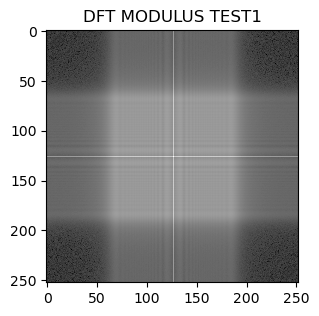

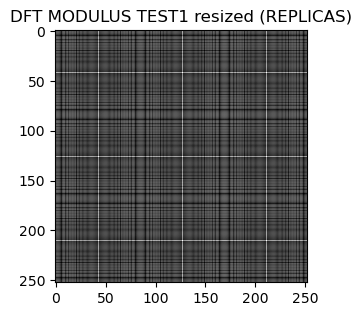

In [16]:
display_image(TEST1_mod, title='DFT MODULUS TEST1', size=1)
tmp = np.hstack((TEST1_sub_mod,TEST1_sub_mod,TEST1_sub_mod))
TEST1_sub_mod_replicas = np.vstack((tmp,tmp,tmp))
display_image(TEST1_sub_mod_replicas,title='DFT MODULUS TEST1 resized (REPLICAS)',size=1)


<font color='purple'>As we have not filtered before downsampling, could you tell in which range of frequencies
(in normalized frequency units $f_x, f_y$) of the transform image in the `TEST1` case, we
have no aliasing effect? (assume that the `TEST1` image only contains frequency components
below the frequency you have estimated at the end of section 1 and theoretically estimate
the alias free band).

Please note that when we resize figures resulting from function display_image(), there are implicit processes of downsampling and interpolation. Please use the parameter `size` of the function with caution. For instance, the effect of disappearing lines in the display of the spectrum of `TEST1_sub` when `size` is different than 1 is due to this downsampling.</font>

---
<font color='red'>Answer: 
</font> 

**If we downsample an image with size M and N, we will have aliasing if:**

$$F_x > \frac{1}{2 \cdot M}$$

$$F_y > \frac{1}{2 \cdot N}$$

**In our case:**

$$F_x > \frac{1}{6}$$

$$F_y > \frac{1}{6}$$

**Since our frequencies range is between -$\frac{1}{4}$ and $\frac{1}{4}$, those frequencies that fall both vertically and horizontally between $\frac{1}{4}$ and $\frac{1}{6}$ will experience aliasing, while the others will not.**

**Due to aliasing, some frequencies change position and therefore overlap with those that are within the range where aliasing is not present. In this case, when we perform downsampling with a factor of 3, we will have samples every 1/3 in both vertical and horizontal directions, and since the frequency bandwidth is between -$\frac{1}{4}$ and $\frac{1}{4}$, those frequencies that do not have aliasing will be ($\frac{1}{3}$ - $\frac{1}{4}$) = $\frac{1}{12}$, so every multiple of $\frac{1}{12}$ will be where we can recover our frequency without aliasing.**

#### Downsampling experiment

Let's experiment with the downsampling of a second image `test2`. We will generate the image `test2` as a numpy matrix by using an inverse 2D DFT transform, as follows:

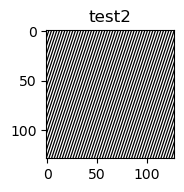

In [17]:
# create a 128x128 matrix of zeros
X = np.zeros((128,128))

# set coefficient value in 16th row, 48th column (starting with 0)
X[16,48] = 128*128

# compute the real part of the inverse 2D-DFT
test2 = np.real(np.fft.ifft2(X)); 

# shifts test2 to avoid negative values
test2 = test2 + 1;
display_image(test2, title='test2', size=1)

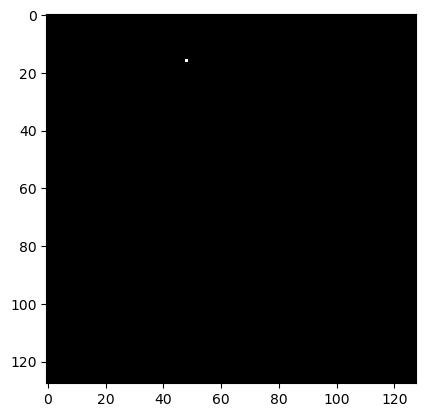

In [18]:
display_image(X)


As a reminder, direct and inverse Discrete Fourier Transforms (DFT) of an image (2D
signal) are defined as follows:

$$X[k,l] = \sum^{M-1}_{m=0}\sum^{N-1}_{n=0}x[m,n]e^{-j2\pi \left( \frac{mk}{M}+\frac{nl}{N}\right) }$$ with $0 \leq k < M-1$ and $0 \leq  l < N-1$

$$x[m,n] = \frac{1}{MN}\sum^{k=0}_ {M-1}\sum^{l=0}_ {N-1}X[k,l]e^{j2\pi\left( \frac{mk}{M} + \frac{nl}{N}  \right)}$$


To be consistent with the scikt notation, we will assume that m indicates rows (vertical
index) and n indicates columns (horizontal index). Therefore, k will be the index for the
normalized vertical frequency, and l for the horizontal frequency. Note that the DC coefficient corresponds to the $X[0,0]$ position of and the component with $(f_x ,f_y)=(16/128,48/128)$ corresponds to $X[16,48]$. 

Considering that we have just computed the real part of the inverse transform of a $128x128$ spectrum with a single non-zero value (actually, a spectrum with one delta), could you obtain the expressions requested below?


<font color='purple'>1) The analytic expression of the transform $X[k, l]$ we have just created as a function of
the 2D Kronecker delta in the transform domain (remember $\delta[k, l] = \delta[k] \cdot \delta[l]$)</font>

---
<font color='red'>Answer: </font>

**The general expression is: $$X[k,l] = \sum^{M-1}_{m=0}\sum^{N-1}_{n=0}x[m,n]e^{-j2\pi \left( \frac{mk}{M}+\frac{nl}{N}\right) }$$**

**We can see how DFT has only one non value, whose position is X[16, 48]. So we must use the Delta function shifted so that returns one at the position where is the non null value.**

**The expression of DTF is: $X[k, l] = 128\cdot 128 \cdot \delta[k - 16] \cdot \delta[l - 48]$**

**We can check that: $X[16, 48] = 128\cdot 128 \cdot \delta[16 - 16] \cdot \delta[48 - 48] = 128\cdot 128 \cdot \delta[0] \cdot \delta[0] = 128 \cdot 128$**

    

<font color='purple'>2) The result of the inverse 2D DFT transform $x[m,n]=DFT^{-1}\left\{X[k, l]\right\}$ as an exponential
function in $[m,n]$.</font>

---
<font color='red'>Answer: </font>

**The general expression is $$x[m,n] = \frac{1}{MN}\sum^{k=0}_ {M-1}\sum^{l=0}_ {N-1}X[k,l]e^{j2\pi\left( \frac{mk}{M} + \frac{nl}{N}  \right)}$$**

**As we have said in first part, DFT only has one non value, so formula becomes:**

$$x[m,n] = \frac{1}{128\cdot128} 128\cdot128 \cdot e^{j2\pi\left( \frac{m16}{128} + \frac{n48}{128}  \right)}$$

$$x[m,n] = e^{j2\pi\left( \frac{m16}{128} + \frac{n48}{128}  \right)}$$




<font color='purple'>3) A closed expression for the image $test2[m,n]=REAL\left\{x[m,n]\right\}+1$</font>

---
<font color='red'>Answer: </font>

**From last exercise we know:**

$$x[m,n] = e^{j2\pi\left( \frac{m16}{128} + \frac{n48}{128}  \right)}$$

**We have to take real part. We can use Euler's Formula:**

$$e^{j \cdot \theta} = \cos\theta + j\cdot\ \sin\theta$$

$$x[m,n] = e^{j2\pi\left( \frac{m16}{128} + \frac{n48}{128}  \right)} = \cos(\frac{2\pi m16}{128} + \frac{2\pi n48}{128}) + j\cdot \sin(\frac{2\pi m16}{128} + \frac{2\pi n48}{128})$$

**Real part is cos:**

$$REAL\left\{x[m,n]\right\} = \cos(\frac{2\pi m16}{128} + \frac{2\pi n48}{128})$$

$$test2[m,n]=\cos(\frac{2\pi m16}{128} + \frac{2\pi n48}{128})+1$$



We now downsample the resulting image by a factor 2 and show both the original `test2` image and the resized version `test2_sub`:

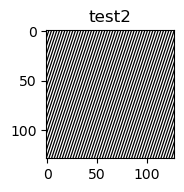

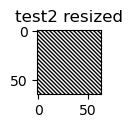

In [19]:
display_image(test2, title='test2', size=1)
test2_sub = sktf.resize(test2,np.asarray(test2.shape)/2, anti_aliasing=False, mode='constant');
display_image(test2_sub, title='test2 resized', size=1)


<font color='purple'>Compare the original `test2` and the downsampled `test2_sub` image, do you see any special effect?
Describe how the frequency of the 2D sinusoid has apparently changed with the downsampling.</font>

---
<font color='red'>Answer: </font> 

**Downsampling has rotated our original image, this is probably because it has been produced aliasing. The sine wave without downsampling is:**
$$\cos(\frac{2\pi m16}{128} + \frac{2\pi n48}{128})$$

**Now, if we apply a downsampling factor of 2, this becomes:**

$$\cos(\frac{2\pi m \cdot 2 \cdot 16}{128} + \frac{2\pi n \cdot 2 \cdot 48}{128})$$

$$\cos(\frac{2\pi m16}{64} + \frac{2\pi n48}{64})$$

**Now, the bandwidth becomes 64, but we need to consider whether there is aliasing. We will have aliasing if we have horizontal and vertical frequencies (from original image) that meet the following condition:**

$F_x$ > $\frac{1}{2 \cdot M}$ where M = 2, per tant $F_x$ > 1/4

**The same with vertical:**

$F_y$ > $\frac{1}{2 \cdot N}$ where N = 2, per tant $F_y$ > 1/4

**As $\frac{16}{128}$ is less than $\frac{1}{4}$, in this case aliasing would not be present. However, as $\frac{48}{128}$ is greater than $\frac{1}{4}$, in this case alliasing will appear and it has been what has rotated the image.**

Now display the transform of the two images to better understand what happened:

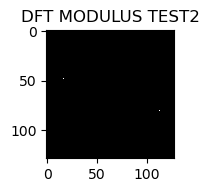

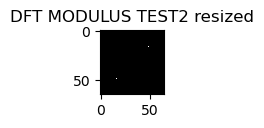

In [20]:
TEST2_mod=np.fft.fftshift(np.log(1+np.abs(np.fft.fft2(test2-1))))
TEST2_sub_mod=np.fft.fftshift(np.log(1+np.abs(np.fft.fft2(test2_sub-1))))
display_image(TEST2_mod,title='DFT MODULUS TEST2',size=1)
display_image(TEST2_sub_mod, title='DFT MODULUS TEST2 resized', size=1)

<font color='purple'>Compare the replicated spectrum of the downsampled image with the original spectrum of `test2`. Explain now more precisely the aliasing effect described in your previous answer? In particular can you compute exactly the frequency components appearing in the image after downsampling?</font>

---
<font color='red'>Answer: </font>

**As we have seen previously, we do have aliasing. In this case, we see how in the frequency representation of our image, frequencies have changed their position because frquencies from different periods have overlapped, causing interference that has modified the image, which is essentially what happened in the original image.**

**The represented frequencies are k = 16 and l = 48, and k = (64 - 16) = 48 and l = (64 - 48) = 16. Normalized, they become ($\frac{16}{64}$, $\frac{48}{64}$) and ($\frac{48}{64}$, $\frac{16}{64}$).**


In the next section, we are going to filter the image before downsampling in order to get a
better result.

## 4 Linear Filters

The direct way to filter an image is to convolve it with an impulse response. Let us
experiment with the `img` image and a gaussian impulse response:

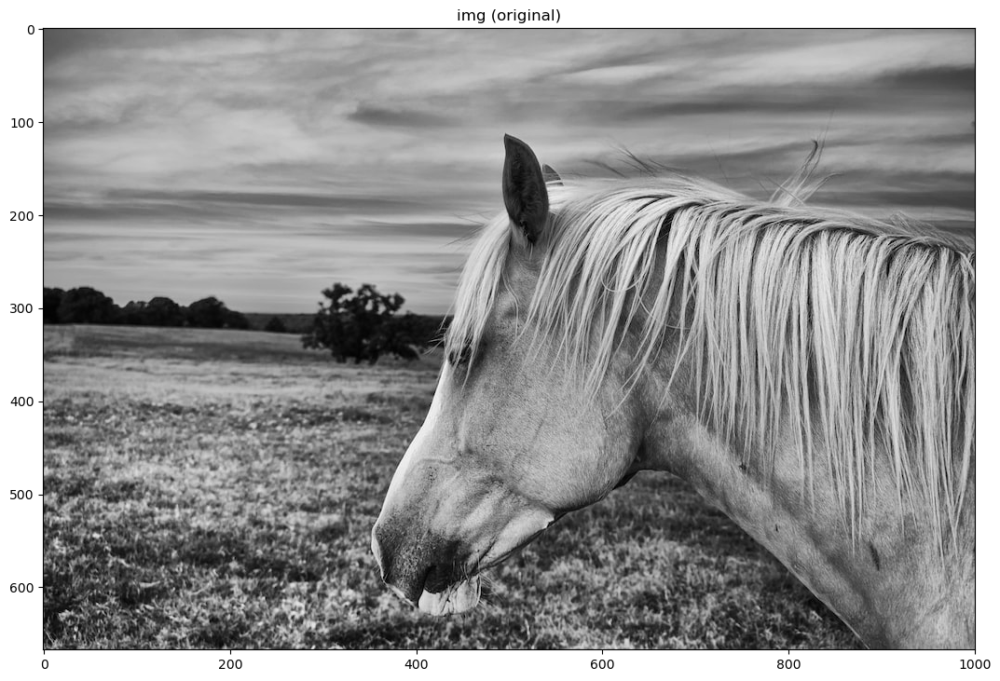

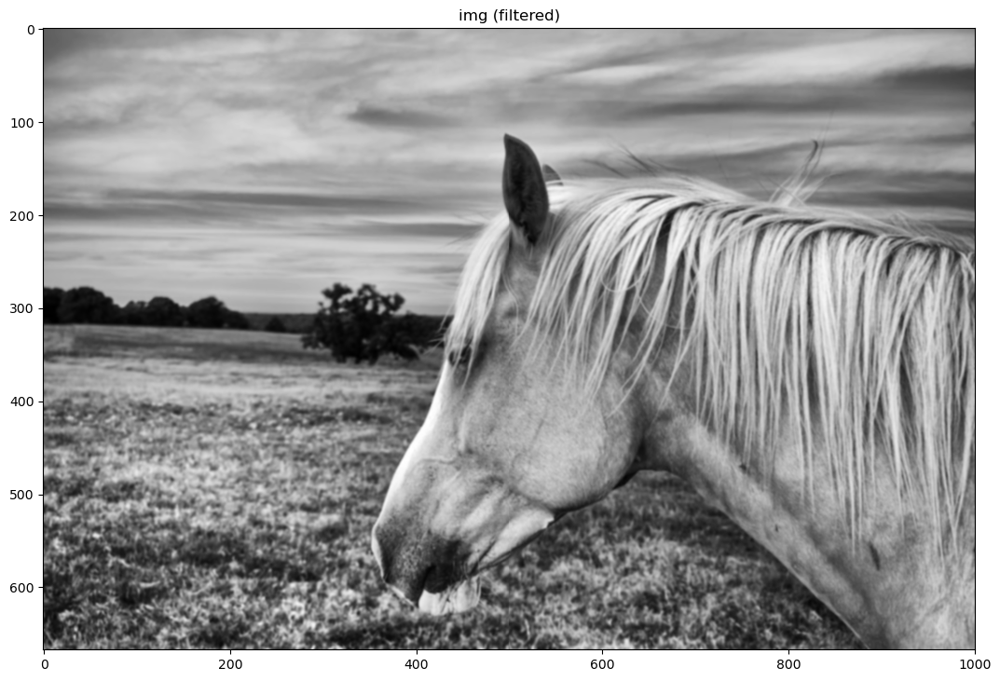

In [21]:
from skimage import filters

sigma = 1
window = 5
truncate = (((window - 1)/2)-0.5)/sigma
img_filt = filters.gaussian(img,sigma=sigma,truncate=truncate);
display_image(img,title='img (original)', size=1)
display_image(img_filt, title='img (filtered)', size=1)


<font color='purple'>Paste the image and describe the effects of this filter and relate these effects with the theoretical properties of the filter.</font>

---
<font color='red'>Answer: </font>

**We can see how the filtered photograph appears slightly blurry. This is because the Gaussian filter is designed to reduce noise and irregularities in an image, which smooths out the pixels and reduces contrast. The amount of smoothing depends on both the variance and size of the filter. We have experimented and found that for a high variance value, the image appears more blurry, while a lower variance value makes it more similar to the original. The same applies to the size of the filter.**

**We also know that a Gaussian filter performs a kind of average of the pixels, making it a low-pass filter. As a result, high frequencies are not fully represented, which explains what we see in the image as described above.**

Another way to filter an image is to simply remove some transform coefficients corresponding to the frequency components to remove. However, this "Frequency Filtering" technique by means of a frequency mask is not always adequate. Let us explore
this issue.

## 5 Frequency filtering

Assume we apply a low pass filter to avoid aliasing problems when downsampling `test1`:

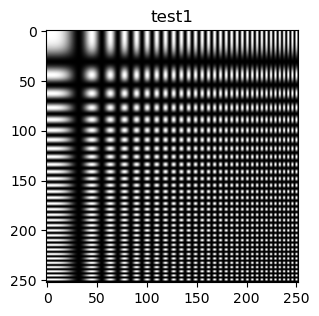

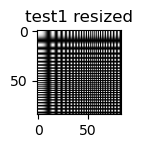

In [22]:
display_image(test1,title='test1',size=1)
display_image(test1_sub, title='test1 resized', size=1)


We could have removed all frequency components above half the new sampling frequency before downsampling by using a frequency mask as done in the following:


42.0


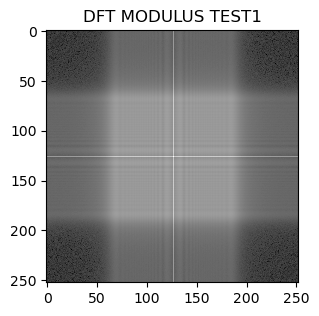

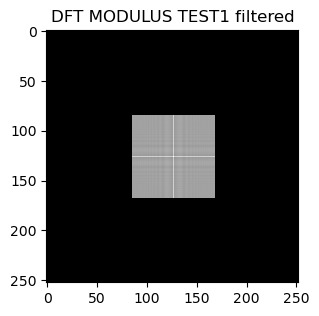

In [23]:
TEST1 = np.fft.fft2(test1)
TEST1_mod = np.fft.fftshift(np.log(1+np.abs(TEST1)))
fils = TEST1.shape[0]
cols = TEST1.shape[1]

print(cols/6)
# mask vertical frequencies
TEST1[int(1/6*fils):int(5/6*fils)+1,:] = 0;

# mask horizontal frequencies
TEST1[:,int(1/6*cols):int(5/6*cols)+1] = 0;

display_image(TEST1_mod, title='DFT MODULUS TEST1', size=1)
display_image(np.fft.fftshift(np.log(1+np.abs(TEST1))), title='DFT MODULUS TEST1 filtered', size=1)


To see the resulting image, we need to apply the inverse FFT transform:

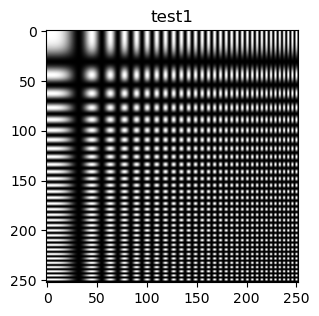

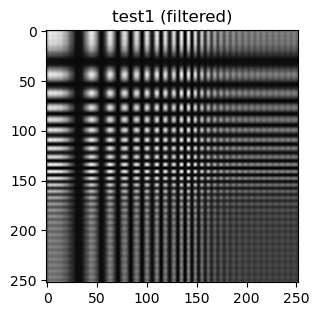

In [24]:
test1_filt = 9*np.real(np.fft.ifft2(TEST1))
display_image(test1, title='test1', size=1)
display_image(test1_filt, title='test1 (filtered)', size=1)

Now compare what happens when downsampling this result with the previous case:

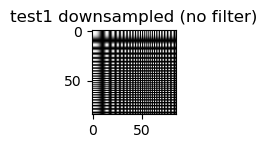

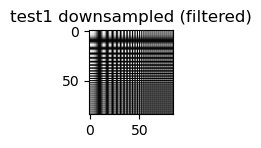

In [25]:
test1_sub  = transform.resize(test1,     np.asarray(test1.shape)/3,      anti_aliasing=False, mode='constant');
test1_sub2 = transform.resize(test1_filt,np.asarray(test1_filt.shape)/3, anti_aliasing=False, mode='constant');

display_image(test1_sub,title='test1 downsampled (no filter)', size=1)
display_image(test1_sub2,title='test1 downsampled (filtered)', size=1)


As you can see, aliasing is not present but, of course, the highest frequencies have been
removed by the low pass filter. However, this filtering technique may not always be
adequate. Let's apply the same technique to the IMG image. Then we filter it as we previously have done with test2:

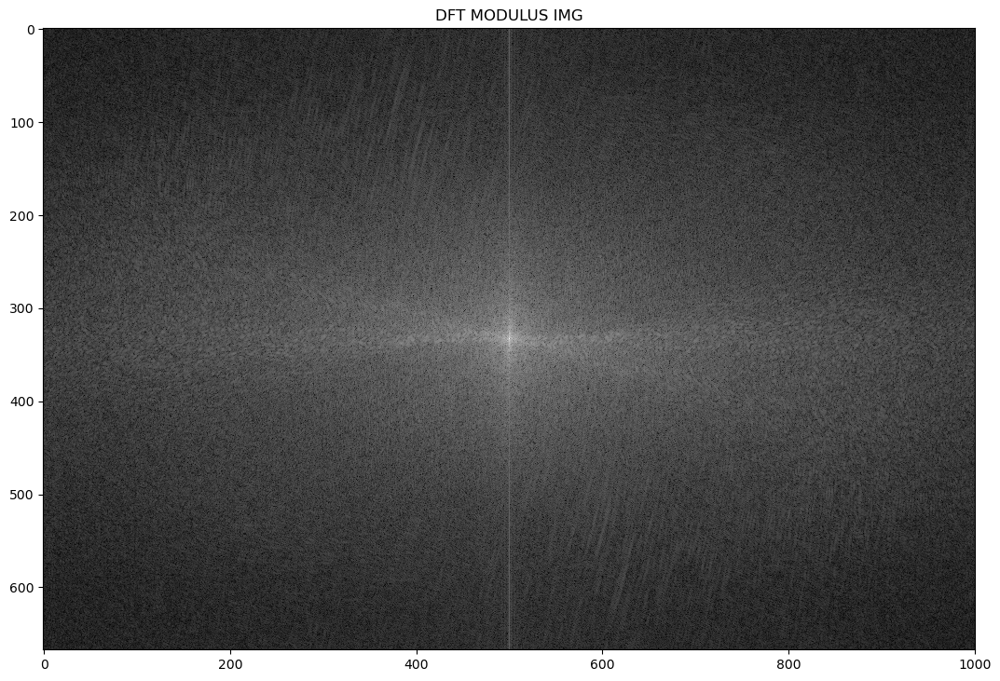

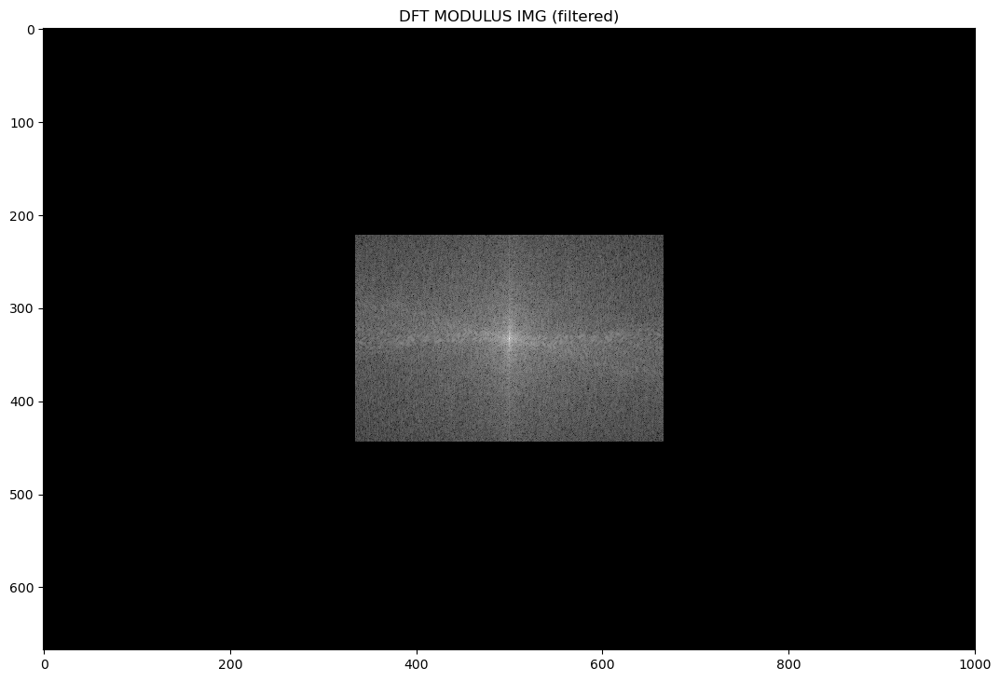

In [26]:
IMG = np.fft.fft2(img)
IMG_mod = np.fft.fftshift(np.log(1+abs(IMG)))
fils = IMG.shape[0]
cols = IMG.shape[1]
# mask vertical frequencies
IMG[int(1/6*fils):int(5/6*fils)+1,:] = 0
# mask horizontalal frequencies
IMG[:,int(1/6*cols):int(5/6*cols)+1] = 0

display_image(IMG_mod, title='DFT MODULUS IMG', size=1)
display_image(np.fft.fftshift(np.log(1+np.abs(IMG))), title='DFT MODULUS IMG (filtered)', size=1)

Let's see now the result of the inverse transform:


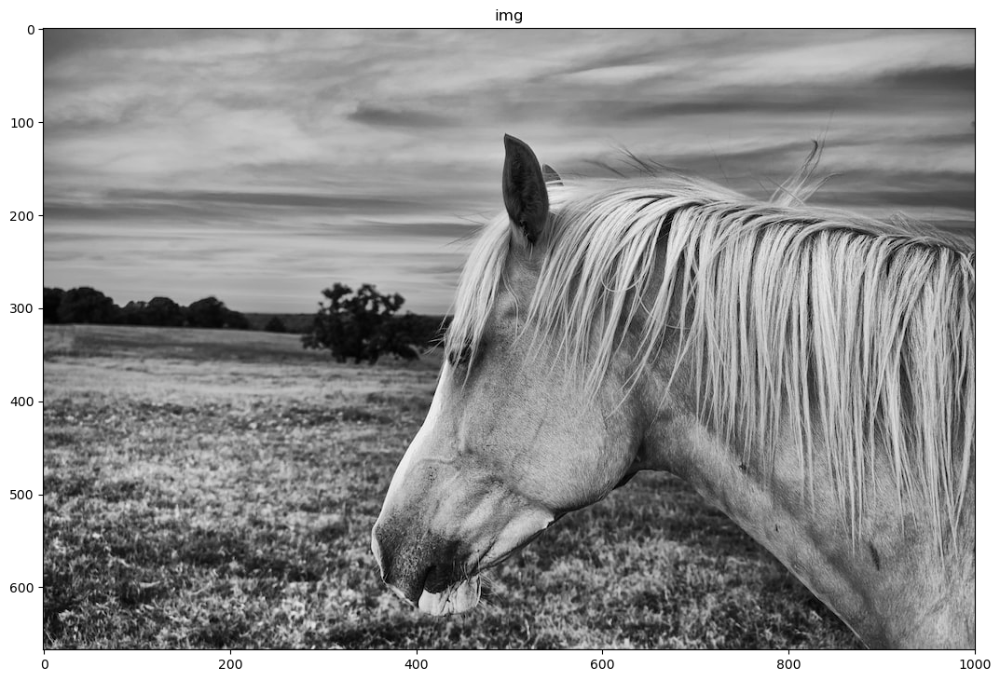

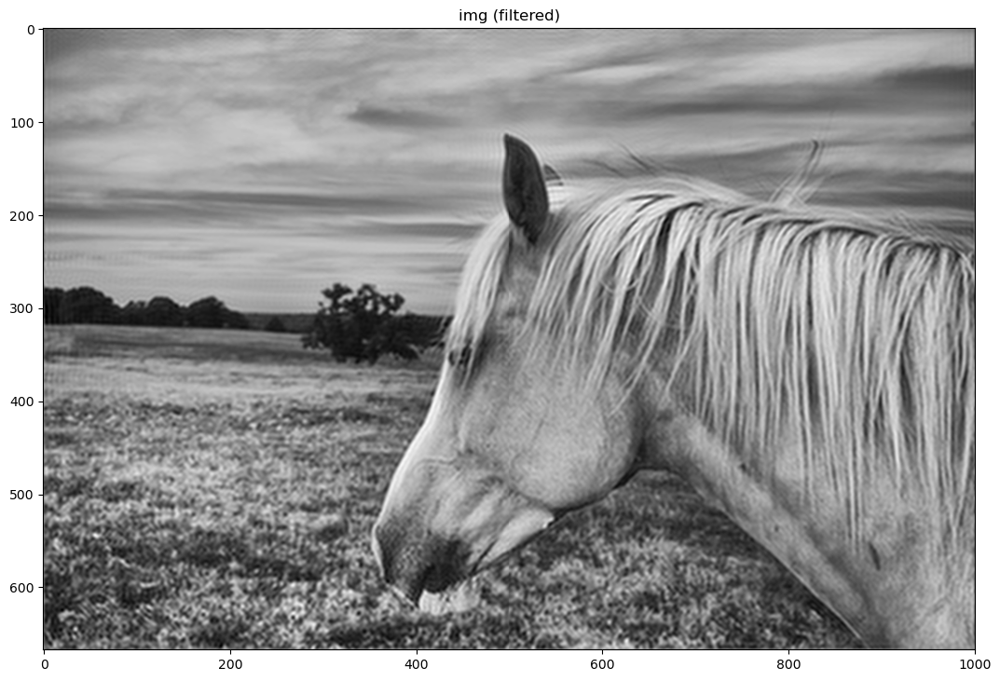

In [27]:
img_filt = 9*np.real(np.fft.ifft2(IMG));
display_image(img, title='img', size=1)
display_image(img_filt, title='img (filtered)', size=1)

<font color='purple'>Maximize the window to better see the result. Can you explain this effect?</font>

**In this case, we applied a low-pass filter in order to eliminate high frequencies, that correspon to the regions of the image where pixels change fastly.**

**The filterd image appears smoother and less detailed than the original. We can see how the contours are not marked in the photography and the textures are smoothed out. These textures correspond to high frequencies, which means we lose image quality, but we avoid aliasing, that is our objective. If we don't filter the original image, the effect would have been worst than which has been produced filtering and removing high frequencies**

**For example, in the image we are not able to distinguish the horizon or the changes of colour and texture thas the grass or the horse has.**

## 6 Removal of a sinusoidal interference

We can use notch filters to remove some kinds of interference. Imagine that the `img` image has been corrupted by a sinusoidal interference as follows. First, we generate the interferring signal. We follow the same process than in section
"Transform Domain":


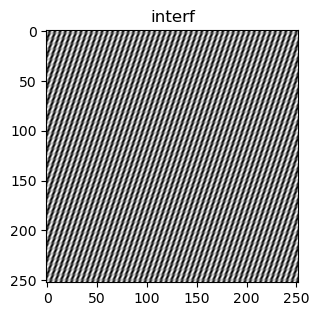

In [28]:
# resize img to a 252x252 image
img2 = transform.resize(img,(252,252), anti_aliasing=True, mode='constant');

# create a 252x252 matrix of zeros
INTERF = np.zeros(img2.shape)

# set some energy at coefficient X(16,48)
INTERF[16,48] = 4000

# same at the X(64,48)
INTERF[64,48] = 1000

# inverse transform to compute the interferring image
interf = np.real(np.fft.ifft2(INTERF)+1)

display_image(interf, title='interf', size=1)


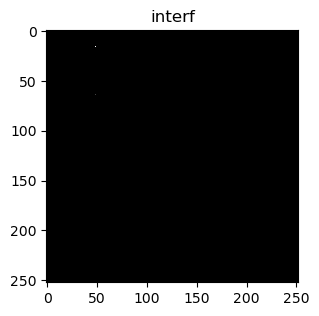

In [29]:
display_image(INTERF, title='interf', size=1)

And now we corrupt the `img2`  image by adding `interf`:



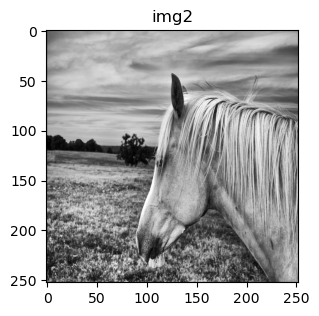

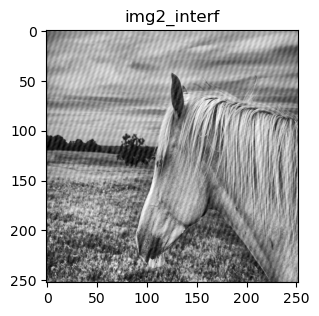

In [30]:
img2_interf = interf + img2/np.amax(img2)
display_image(img2, title='img2', size=1)
display_image(img2_interf, title='img2_interf', size=1)

Let's see the spectrum of the corrupted image:


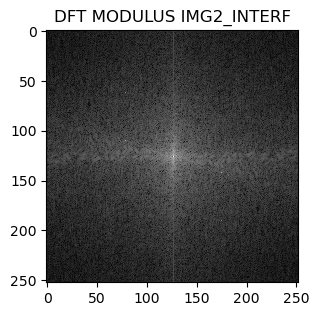

In [31]:
IMG2_INTERF = np.fft.fft2(img2_interf);
display_image(np.fft.fftshift(np.log(1+np.abs(IMG2_INTERF))), title='DFT MODULUS IMG2_INTERF', size=1)

Can you appreciate the interferring coefficients? (play with the `size` parameter to help you see it)

<font color='purple'>Using the method of frequency filtering, try to remove the interference from the image `img2_interf`. You can use a "notch" filter to eliminate the interfering coefficients of high energy in the transform. Write the corresponding commands and explain the strategy you have followed:
</font>


**As we can see in the graphical DFT of the interfered image, we see the four points with energy that correspond to two sinusoidal interference signals with positive and negative frequency. So these are the frequences that we have to remove in order to avoid interference.**

**The strategy to follow is to take and look at what values these 4 points are and assign them as zero in order to remove this frequencies. After this, we do inverse DFT to get the image.**

**The positions that we have to fill with zero are:**

**[16, 48], [64, 48] and their symmetrics values [252 - 16, 252 - 48], [252 - 64, 252 - 48]**

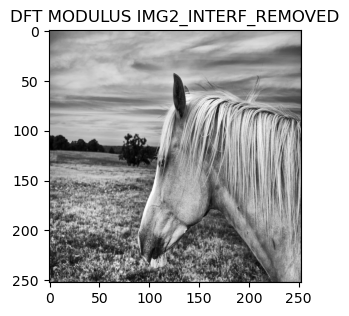

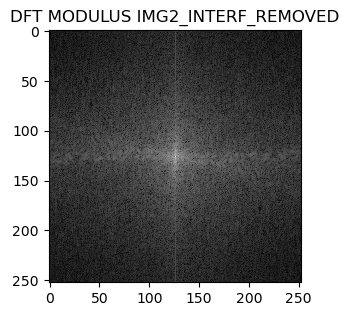

In [32]:
# Write below the commands you need
IMG2_INTERF[16, 48] = 0
IMG2_INTERF[64, 48] = 0
IMG2_INTERF[236, 204] = 0
IMG2_INTERF[188, 204] = 0

display_image(np.real(np.fft.ifft2(IMG2_INTERF)+1), title='DFT MODULUS IMG2_INTERF_REMOVED', size=1)
display_image(np.fft.fftshift(np.log(1+np.abs(IMG2_INTERF))), title='DFT MODULUS IMG2_INTERF_REMOVED', size=1)

**We can see that we have eliminated the frequencies from the interferences. The photo has no interferences and the frequential representation of the image does not have the 4 points with high energy.**